<a href="https://colab.research.google.com/github/joan-chep/GROUP_3_WEEK_10_CORE/blob/main/NeuralNetwork_Loan_Default_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**GROUP 3 MEMBERS**

Bradley Agwa

Joan Chepkwony 

Stacy Keago

Simon Mmari

Brian Kipngeno

Billiah Menyenya



### **Define the question**

To build a classification model to predict whether the loan borrower will default or not.

### **Defining the Metrics for success.**

We will achieve our objective when our model achieves an accuracy of atleast 75%.

### **Understanding the dataset context.**

Banks earn a major revenue from lending loans. But it is often associated with risk. The borrowers may default on the loan. To mitigate this issue, the banks have decided to use Machine Learning to overcome this issue. They have collected past data on the loan borrowers & would like you to develop a strong ML Model to classify if any new borrower is likely to default or not.

The dataset is enormous & consists of multiple deterministic factors like borrower's income, gender, loan purpose, etc. The dataset is subject to strong multicollinearity & empty values.

## **Experimental design taken.** 

Load data

Exploratory Data Analysis

Visualization

Data Cleaning

Feature Engineering

Modeling K Nearest Neighbour(KNN)

Hyperparameter Tuning

Optimization Techniques for KNN.

Recommendations

Challenging the model

Conclusion

## **Import Libraries.**

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
from numpy import array

from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
import math
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import  accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
%matplotlib inline

## **Load Datasets.**

In [ ]:
loan = pd.read_csv('/content/Loan_Default.csv')

### **Preview the datasets.**

In [ ]:
# Preview the top 5 rows
loan.head()

,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,...,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
0,24890,2019,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,...,EXP,758.0,CIB,25-34,to_inst,98.728814,south,direct,1.0,45.0
1,24891,2019,cf,Male,nopre,type2,p1,l1,nopc,b/c,...,EQUI,552.0,EXP,55-64,to_inst,NaN,North,direct,1.0,NaN
2,24892,2019,cf,Male,pre,type1,p1,l1,nopc,nob/c,...,EXP,834.0,CIB,35-44,to_inst,80.019685,south,direct,0.0,46.0
3,24893,2019,cf,Male,nopre,type1,p4,l1,nopc,nob/c,...,EXP,587.0,CIB,45-54,not_inst,69.376900,North,direct,0.0,42.0
4,24894,2019,cf,Joint,pre,type1,p1,l1,nopc,nob/c,...,CRIF,602.0,EXP,25-34,not_inst,91.886544,North,direct,0.0,39.0


In [ ]:
# Preview the last 5 rows
loan.tail()

,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,...,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
65838,90728,2019,cf,Sex Not Available,nopre,type2,p3,l2,nopc,b/c,...,CIB,524.0,CIB,45-54,to_inst,77.925532,south,direct,0.0,36.0
65839,90729,2019,cf,Male,NaN,type1,p3,l1,nopc,nob/c,...,CRIF,541.0,CIB,45-54,to_inst,69.701087,North,direct,0.0,43.0
65840,90730,2019,cf,Joint,nopre,type1,p4,l1,nopc,nob/c,...,EXP,712.0,EXP,>74,to_inst,52.139364,North,direct,0.0,49.0
65841,90731,2019,cf,Sex Not Available,nopre,type1,p3,l1,nopc,nob/c,...,CRIF,559.0,CIB,45-54,to_inst,68.208661,south,direct,0.0,34.0
65842,90732,2019,cf,Joint,nopre,type1,p1,l1,nopc,n,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## **Checking Dataset shape.**

In [ ]:
loan.shape

(65843, 34)

The dataset has 148670 rows and 34 columns.

## **Check the columns.**

In [ ]:
loan.columns

Index(['ID', 'year', 'loan_limit', 'Gender', 'approv_in_adv', 'loan_type',
       'loan_purpose', 'Credit_Worthiness', 'open_credit',
       'business_or_commercial', 'loan_amount', 'rate_of_interest',
       'Interest_rate_spread', 'Upfront_charges', 'term', 'Neg_ammortization',
       'interest_only', 'lump_sum_payment', 'property_value',
       'construction_type', 'occupancy_type', 'Secured_by', 'total_units',
       'income', 'credit_type', 'Credit_Score', 'co-applicant_credit_type',
       'age', 'submission_of_application', 'LTV', 'Region', 'Security_Type',
       'Status', 'dtir1'],
      dtype='object')

#### Drop columns

In [ ]:
# Dropping Neg ammortization column
#
loan.drop('Neg_ammortization',axis='columns', inplace=True)

In [ ]:

loan.drop(['ID', 'year'], axis = 1, inplace = True)

In [ ]:
loan.shape

(65843, 31)

In [ ]:
loan.dtypes

loan_limit                    object
Gender                        object
approv_in_adv                 object
loan_type                     object
loan_purpose                  object
Credit_Worthiness             object
open_credit                   object
business_or_commercial        object
loan_amount                  float64
rate_of_interest             float64
Interest_rate_spread         float64
Upfront_charges              float64
term                         float64
interest_only                 object
lump_sum_payment              object
property_value               float64
construction_type             object
occupancy_type                object
Secured_by                    object
total_units                   object
income                       float64
credit_type                   object
Credit_Score                 float64
co-applicant_credit_type      object
age                           object
submission_of_application     object
LTV                          float64
R

## **Statistical summary.**

In [ ]:
loan.describe().T

,count,mean,std,min,25%,50%,75%,max
loan_amount,65842.0,331421.326813,183383.823065,26500.000000,196500.000000,296500.000000,436500.000000,3.576500e+06
rate_of_interest,49776.0,4.046002,0.559008,0.000000,3.625000,3.990000,4.375000,8.000000e+00
Interest_rate_spread,49687.0,0.439194,0.512600,-3.638000,0.074000,0.387800,0.767650,3.357000e+00
Upfront_charges,48340.0,3225.916199,3260.991689,0.000000,567.487500,2587.765000,4815.000000,6.000000e+04
term,65820.0,335.554740,57.931713,96.000000,360.000000,360.000000,360.000000,3.600000e+02
property_value,59176.0,497904.015141,363064.864123,8000.000000,268000.000000,418000.000000,618000.000000,1.650800e+07
income,61851.0,6960.448174,7005.023556,0.000000,3720.000000,5700.000000,8520.000000,5.785800e+05
Credit_Score,65842.0,699.850278,115.902824,500.000000,599.000000,700.000000,801.000000,9.000000e+02
LTV,59176.0,73.125964,55.371347,0.967478,60.551948,75.201613,86.372343,7.831250e+03
Status,65842.0,0.245360,0.430304,0.000000,0.000000,0.000000,0.000000,1.000000e+00


## **Check for Null values.**

In [ ]:
loan.isnull().sum()

loan_limit                    1474
Gender                           0
approv_in_adv                  367
loan_type                        0
loan_purpose                    54
Credit_Worthiness                0
open_credit                      0
business_or_commercial           0
loan_amount                      1
rate_of_interest             16067
Interest_rate_spread         16156
Upfront_charges              17503
term                            23
interest_only                    1
lump_sum_payment                 1
property_value                6667
construction_type                1
occupancy_type                   1
Secured_by                       1
total_units                      1
income                        3992
credit_type                      1
Credit_Score                     1
co-applicant_credit_type         1
age                             90
submission_of_application       90
LTV                           6667
Region                           1
Security_Type       

### Check for unique values

In [ ]:
loan.nunique()

loan_limit                       2
Gender                           4
approv_in_adv                    2
loan_type                        3
loan_purpose                     4
Credit_Worthiness                2
open_credit                      2
business_or_commercial           3
loan_amount                    185
rate_of_interest               116
Interest_rate_spread         18335
Upfront_charges              28564
term                            24
interest_only                    2
lump_sum_payment                 2
property_value                 330
construction_type                2
occupancy_type                   3
Secured_by                       2
total_units                      4
income                         807
credit_type                      4
Credit_Score                   401
co-applicant_credit_type         2
age                              7
submission_of_application        2
LTV                           6108
Region                           4
Security_Type       

In [ ]:
loan['Gender'].unique()

array(['Sex Not Available', 'Male', 'Joint', 'Female'], dtype=object)

In [ ]:
# Drop missing values in the 'Status' column
loan['Status'].dropna()

0        1.0
1        1.0
2        0.0
3        0.0
4        0.0
        ... 
65837    0.0
65838    0.0
65839    0.0
65840    0.0
65841    0.0
Name: Status, Length: 65842, dtype: float64

In [ ]:
loan['Status'].isnull().sum()

1

In [ ]:
loan.columns

Index(['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose',
       'Credit_Worthiness', 'open_credit', 'business_or_commercial',
       'loan_amount', 'rate_of_interest', 'Interest_rate_spread',
       'Upfront_charges', 'term', 'interest_only', 'lump_sum_payment',
       'property_value', 'construction_type', 'occupancy_type', 'Secured_by',
       'total_units', 'income', 'credit_type', 'Credit_Score',
       'co-applicant_credit_type', 'age', 'submission_of_application', 'LTV',
       'Region', 'Security_Type', 'Status', 'dtir1'],
      dtype='object')

In [ ]:
loan[['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose','Credit_Worthiness', 'open_credit', 'business_or_commercial','loan_amount', 'rate_of_interest', 'Interest_rate_spread','Upfront_charges', 'term', 'interest_only', 'lump_sum_payment','property_value', 'construction_type', 'occupancy_type', 'Secured_by','total_units', 'income', 'credit_type', 'Credit_Score', 'co-applicant_credit_type', 'age', 'submission_of_application', 'LTV','Region', 'Security_Type', 'Status', 'dtir1']] = loan[['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose','Credit_Worthiness', 'open_credit', 'business_or_commercial','loan_amount', 'rate_of_interest', 'Interest_rate_spread','Upfront_charges', 'term', 'interest_only', 'lump_sum_payment','property_value', 'construction_type', 'occupancy_type', 'Secured_by','total_units', 'income', 'credit_type', 'Credit_Score', 'co-applicant_credit_type', 'age', 'submission_of_application', 'LTV','Region', 'Security_Type', 'Status', 'dtir1']].fillna(loan[['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose','Credit_Worthiness', 'open_credit', 'business_or_commercial','loan_amount', 'rate_of_interest', 'Interest_rate_spread','Upfront_charges', 'term', 'interest_only', 'lump_sum_payment','property_value', 'construction_type', 'occupancy_type', 'Secured_by','total_units', 'income', 'credit_type', 'Credit_Score','co-applicant_credit_type', 'age', 'submission_of_application', 'LTV','Region', 'Security_Type', 'Status', 'dtir1']].mean())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


### Check for duplicates

In [ ]:
loan.duplicated().sum()

0

#### Histogram showing distribution of column values

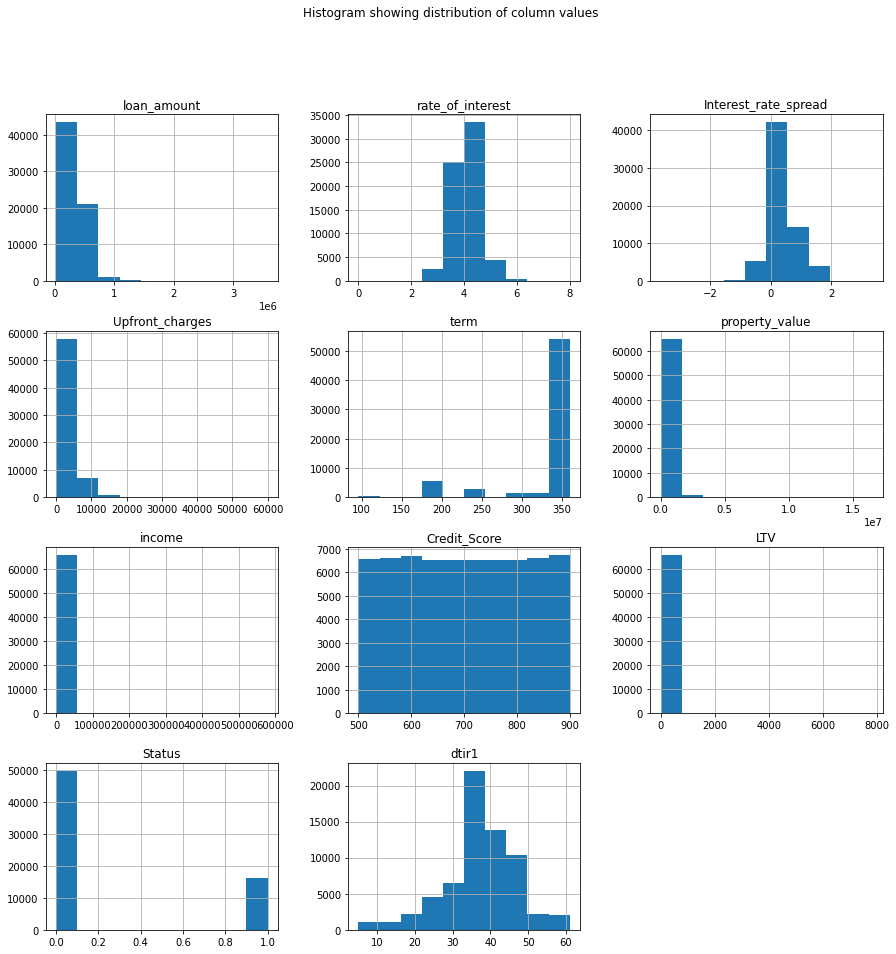

In [ ]:
loan.hist(bins=10, figsize=(15,15))
plt.suptitle("Histogram showing distribution of column values")
plt.savefig('Histogram')
plt.show()

### Label encode some columns

In [ ]:
#Encoding columns
# encoding the true / false columns 

cat_cols = ["Status", "loan_limit", "Gender", "income", "age"]

In [ ]:
loan['Status'].unique()

array([1.       , 0.       , 0.2453601])

In [ ]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
categ = ['loan_limit','Gender','open_credit','approv_in_adv','loan_type','loan_purpose','Credit_Worthiness']

# Encode Categorical Columns 
le = LabelEncoder()
loan[categ] = loan[categ].apply(le.fit_transform) 

In [ ]:
categ1 = ['open_credit','business_or_commercial','co-applicant_credit_type','submission_of_application']
# Encode Categorical Columns 
le = LabelEncoder()
loan[categ1] = loan[categ1].apply(le.fit_transform) 

In [ ]:
categ2 = ['business_or_commercial','Region']

# Encode Categorical Columns 
le = LabelEncoder()
loan[categ] = loan[categ].apply(le.fit_transform) 

In [ ]:
loan1 = pd.get_dummies(loan)
loan1.head()

,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,rate_of_interest,...,age_55-64,age_65-74,age_<25,age_>74,Region_North,Region_North-East,Region_central,Region_south,Security_Type_Indriect,Security_Type_direct
0,0,3,0,0,0,0,0,2,116500.0,4.046002,...,0,0,0,0,0,0,0,1,0,1
1,0,2,0,1,0,0,0,0,206500.0,4.046002,...,1,0,0,0,1,0,0,0,0,1
2,0,2,1,0,0,0,0,2,406500.0,4.560000,...,0,0,0,0,0,0,0,1,0,1
3,0,2,0,0,3,0,0,2,456500.0,4.250000,...,0,0,0,0,1,0,0,0,0,1
4,0,1,1,0,0,0,0,2,696500.0,4.000000,...,0,0,0,0,1,0,0,0,0,1


# **Univariate Analysis.**

In [ ]:
!pip install -U pandas-profiling

In [ ]:
import pandas_profiling as pp
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from pandas_profiling import ProfileReport
ProfileReport(loan, title = "Loan Default")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

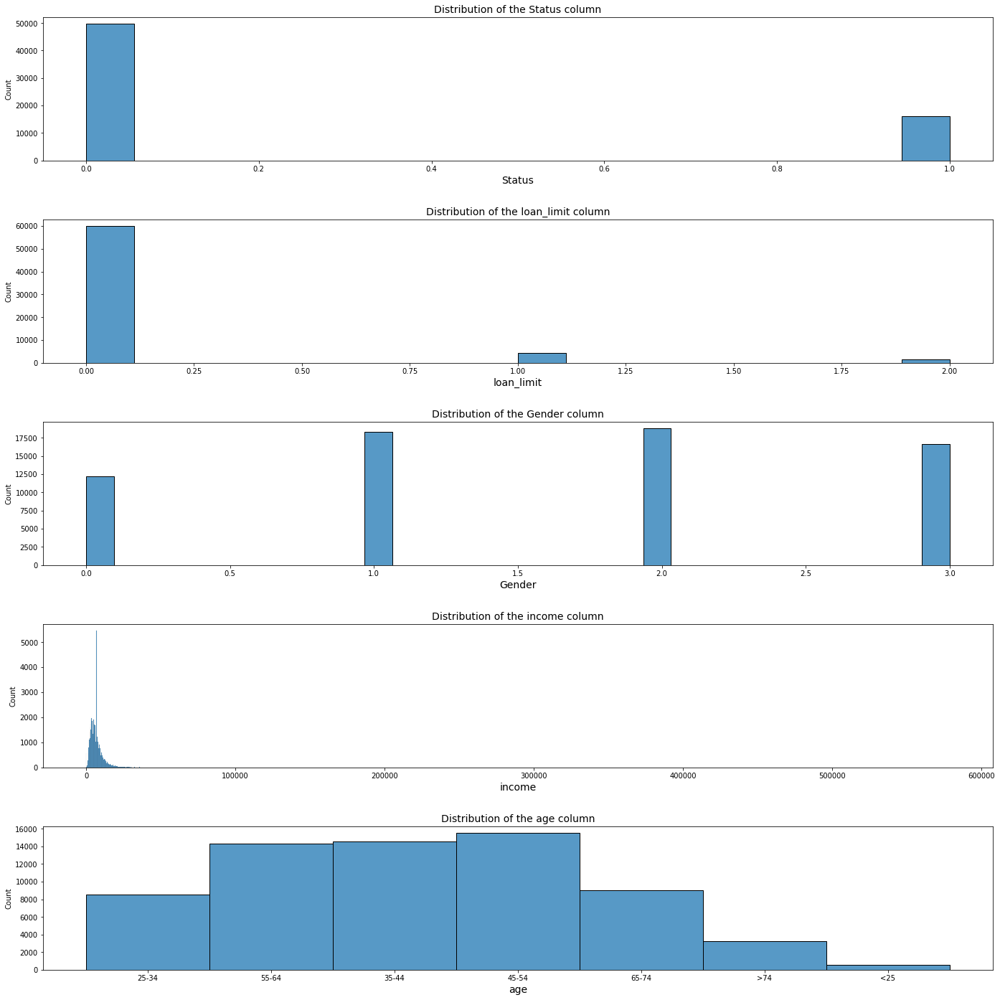

In [ ]:
col_names = ["Status", "loan_limit", "Gender", "income", "age"]
fig, ax = plt.subplots(len(col_names), figsize = (20,20))
for i, col_val in enumerate(col_names):

    sns.histplot(x = loan[col_val], ax=ax[i])
    ax[i].set_title('Distribution of the {} column'.format(col_val), fontsize=14)
    ax[i].set_xlabel(col_val, fontsize=14)
    ax[i].figure.tight_layout(pad=3.0)
plt.show()

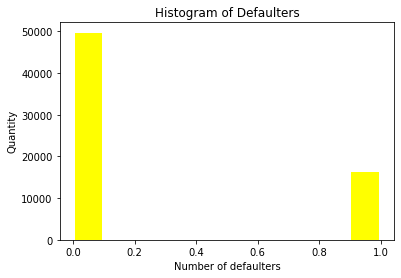

In [ ]:
Status_loan = loan['Status']

plt.hist(Status_loan, bins=10, histtype='bar', rwidth=0.9, color = 'yellow')
plt.xlabel('Number of defaulters')
plt.ylabel('Quantity')
plt.title('Histogram of Defaulters')
plt.show()

0 being defaulters while 1 the number of non defaulters. Defaulters has the highest score.

# **Bivariate Analysis.**

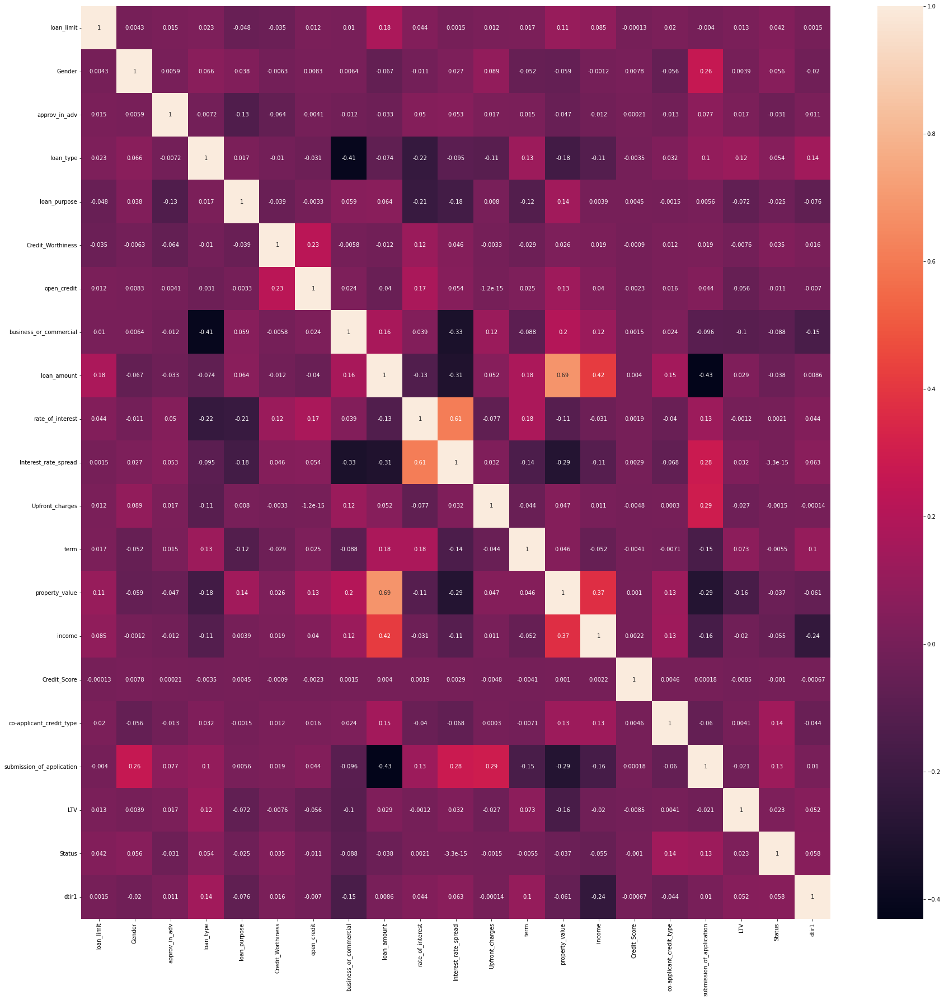

In [ ]:
# Plot a heatmap bivariate analysis of our data
plt.figure(figsize=(30, 30))

loan_corr = loan.corr()
sns.heatmap(loan_corr, 
            xticklabels = loan_corr.columns.values,
            yticklabels = loan_corr.columns.values,
            annot = True);

For the positive correlation we have loan amount and income with a correlation of 0.46 showing that when one increases the other also increases.

The VIF is less than 1 hence there is low multicollinearity.

<Figure size 28800x27360 with 0 Axes>

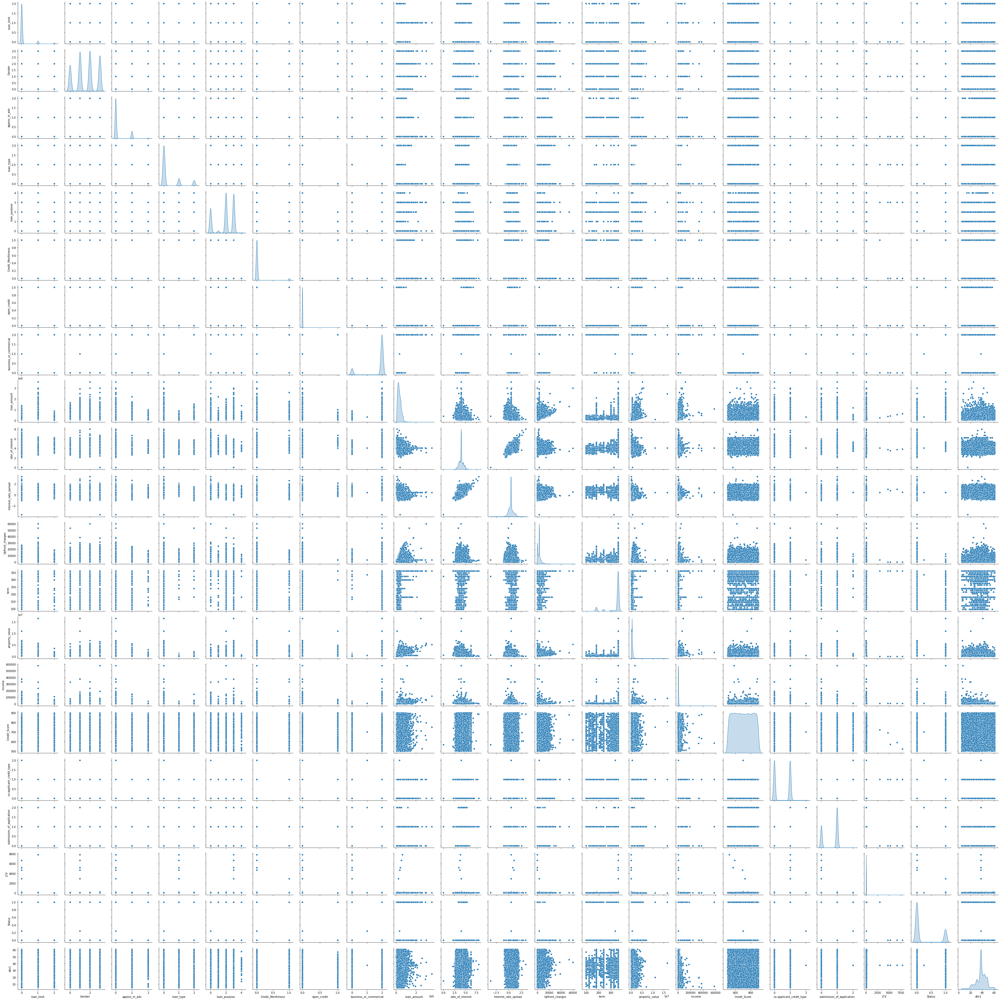

In [ ]:
#Plot a Crossplot Bivariate analysis
plt.figure(figsize=(400, 380))
sns.pairplot(loan, diag_kind='kde');

# **Multivariate Analysis.**

In [ ]:
# Check for the columns that fit correlation
correlation = loan.corr()
correlation

,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,rate_of_interest,...,Upfront_charges,term,property_value,income,Credit_Score,co-applicant_credit_type,submission_of_application,LTV,Status,dtir1
loan_limit,1.000000,0.004287,0.014851,0.022872,-0.047627,-0.035465,1.231050e-02,0.010058,0.175725,0.044228,...,1.174809e-02,0.017206,0.110926,0.084515,-0.000127,0.020253,-0.004026,0.012624,4.230234e-02,0.001490
Gender,0.004287,1.000000,0.005882,0.065508,0.037917,-0.006314,8.281368e-03,0.006411,-0.066655,-0.011344,...,8.934710e-02,-0.052129,-0.058662,-0.001169,0.007834,-0.056456,0.263488,0.003886,5.572919e-02,-0.020160
approv_in_adv,0.014851,0.005882,1.000000,-0.007221,-0.130030,-0.063523,-4.084835e-03,-0.012333,-0.033113,0.049522,...,1.656759e-02,0.015231,-0.046952,-0.012164,0.000210,-0.013070,0.077432,0.016764,-3.126389e-02,0.011098
loan_type,0.022872,0.065508,-0.007221,1.000000,0.016640,-0.010165,-3.123342e-02,-0.407278,-0.074097,-0.224670,...,-1.051537e-01,0.126283,-0.179168,-0.113450,-0.003465,0.032125,0.100203,0.121802,5.369004e-02,0.143387
loan_purpose,-0.047627,0.037917,-0.130030,0.016640,1.000000,-0.039374,-3.277678e-03,0.058858,0.064040,-0.213821,...,7.958780e-03,-0.121708,0.140145,0.003868,0.004538,-0.001517,0.005614,-0.071678,-2.493793e-02,-0.075880
Credit_Worthiness,-0.035465,-0.006314,-0.063523,-0.010165,-0.039374,1.000000,2.252129e-01,-0.005776,-0.012476,0.121786,...,-3.340953e-03,-0.028817,0.025807,0.019237,-0.000896,0.012166,0.019479,-0.007610,3.533158e-02,0.015714
open_credit,0.012310,0.008281,-0.004085,-0.031233,-0.003278,0.225213,1.000000e+00,0.024093,-0.040427,0.168899,...,-1.167233e-15,0.024786,0.131488,0.039787,-0.002350,0.016057,0.044121,-0.056013,-1.116546e-02,-0.007047
business_or_commercial,0.010058,0.006411,-0.012333,-0.407278,0.058858,-0.005776,2.409308e-02,1.000000,0.162888,0.039015,...,1.205176e-01,-0.088472,0.202652,0.119628,0.001466,0.023557,-0.096376,-0.103763,-8.780443e-02,-0.153345
loan_amount,0.175725,-0.066655,-0.033113,-0.074097,0.064040,-0.012476,-4.042707e-02,0.162888,1.000000,-0.125898,...,5.239086e-02,0.176364,0.686007,0.418792,0.004014,0.146410,-0.430481,0.028670,-3.769448e-02,0.008610
rate_of_interest,0.044228,-0.011344,0.049522,-0.224670,-0.213821,0.121786,1.688987e-01,0.039015,-0.125898,1.000000,...,-7.720639e-02,0.176014,-0.110668,-0.031381,0.001928,-0.040365,0.127074,-0.001176,2.148871e-03,0.044111


In [ ]:
# Check the correlation between 'loan_amount' and the other variables
correlation['loan_amount'].sort_values(ascending=False) 

loan_amount                  1.000000
property_value               0.686007
income                       0.418792
term                         0.176364
loan_limit                   0.175725
business_or_commercial       0.162888
co-applicant_credit_type     0.146410
loan_purpose                 0.064040
Upfront_charges              0.052391
LTV                          0.028670
dtir1                        0.008610
Credit_Score                 0.004014
Credit_Worthiness           -0.012476
approv_in_adv               -0.033113
Status                      -0.037694
open_credit                 -0.040427
Gender                      -0.066655
loan_type                   -0.074097
rate_of_interest            -0.125898
Interest_rate_spread        -0.311051
submission_of_application   -0.430481
Name: loan_amount, dtype: float64

In [ ]:
loan.shape

(65843, 31)

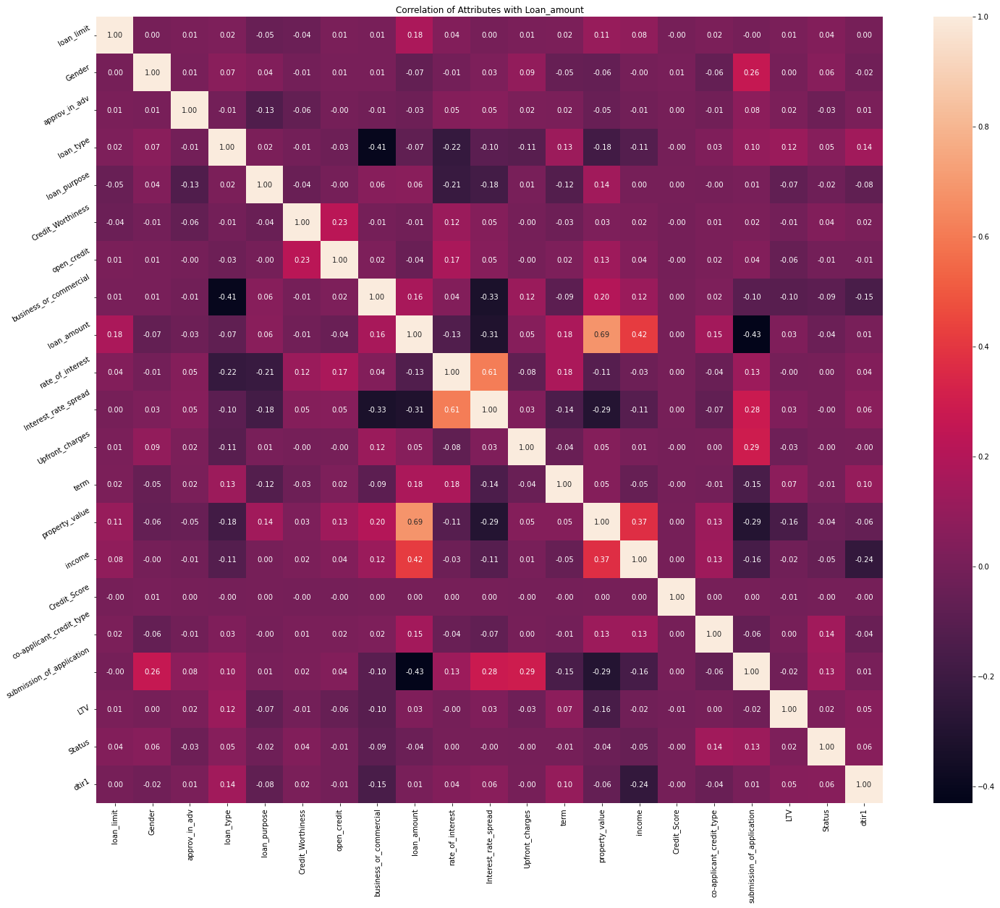

In [ ]:
# Plot the Multivariate correlation heatmap
plt.figure(figsize=(25,20))
plt.title('Correlation of Attributes with Loan_amount')
a = sns.heatmap(correlation, square=True, annot=True, fmt='.2f', linecolor='white')
a.set_xticklabels(a.get_xticklabels(), rotation=90)
a.set_yticklabels(a.get_yticklabels(), rotation=30)           
plt.show()

# Neural Network Classification

In [ ]:
# Dividing the dataset into features and target variable
X = loan1.drop('Status', axis = 1).values
y = loan.Status.values
y=y.astype('int')

In [ ]:
# Splitting the dataset into training and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Import a standardization library
from sklearn.preprocessing import StandardScaler
# Import an Multi-Layer Perceptron Classifier model estimator from Scikit-Learn's neural_network library
from sklearn.neural_network import MLPClassifier

from sklearn.metrics import classification_report,confusion_matrix

In [ ]:
# Normalizing the our training data

# Initialize the scaler
scaler = StandardScaler()

# Fitting the scaler
scaler.fit(X_train)

# Applying the transformation to the data
X_train = scaler.transform(X_train)

X_test = scaler.transform(X_test)


# Model Training

In [ ]:
# Creating our model
mlp = MLPClassifier(hidden_layer_sizes=(25,25,25), activation='logistic', random_state=10, max_iter=500)

# fitting the data
mlp.fit(X_train,y_train)


MLPClassifier(activation='logistic', hidden_layer_sizes=(25, 25, 25),
              max_iter=500, random_state=10)

# Prediction and evaluation

In [ ]:
# Predicting
y_pred = mlp.predict(X_test)

# Evaluation
print(confusion_matrix(y_test,y_pred))

print('-----------------------------------------')

print(classification_report(y_test,y_pred))

[[9929   10]
 [   3 3227]]
-----------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9939
           1       1.00      1.00      1.00      3230

    accuracy                           1.00     13169
   macro avg       1.00      1.00      1.00     13169
weighted avg       1.00      1.00      1.00     13169



The correct predictions are more than incorrect classification, making this a good model for classification.

# CONCLUSION

The neural network is an excellent model compared to other models. The f1 score is 1, making it excellent.